In [1]:
%run 0.1-data-import.ipynb

## 1.1 Futher Exploratory Data Analysis

#### 1.1.1 Descriptive Analysis

#### 1.1.1.1 Overall Sales Performance

In [2]:
daily = data.groupby('date').agg({'sales': 'sum', 'dcoilwtico': 'mean'})

daily['year'] = daily.index.year
daily['quarter'] = daily.index.quarter
daily['month'] = daily.index.month
daily['week'] = daily.index.week
daily['day_of_week'] = daily.index.dayofweek 
daily['day_of_month'] = daily.index.day  
daily['day_of_year'] = daily.index.dayofyear

daily['smooth7_sales'] = daily['sales'].rolling(window=7,  center=True, min_periods=3).mean()
daily['smooth30_sales'] = daily['sales'].rolling(window=30,  center=True, min_periods=15).mean()
daily['smooth365_sales'] = daily['sales'].rolling(window=365,  center=True, min_periods=183).mean()

In [3]:
fig = px.line(daily, y='sales', title='Overall Sales Summary')
fig.update_layout(yaxis_title='Sales (Qty)', xaxis_title='Date')

fig.show()

In [4]:
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x=daily.index, y=daily['smooth7_sales'], mode='lines', name='Sales'), secondary_y=False)
fig.add_trace(go.Scatter(x=daily.index, y=daily['dcoilwtico'], mode='lines', name='Oil Price'), secondary_y=True)
fig.update_layout(title='Sales vs Oil Price', xaxis_title='Date', yaxis_title='Sales (Qty)', yaxis2_title='Oil Price')

fig.show()

In [5]:
# Create df to compare year over year using smooth sales
yoy = daily.groupby(['year', 'day_of_year']).agg({'smooth7_sales': 'sum'}).reset_index()

fig = px.line(yoy, x='day_of_year', y='smooth7_sales', color='year')
fig.update_layout(title='YoY Sales Plot', xaxis_title='Day of Year', yaxis_title='Sales (Qty)')

fig.show()

In [6]:
fig = make_subplots(rows=4, cols=1, subplot_titles=('Day of the Week', 'Week of the Year', 'Month', 'Quarter'))

# Day of the week boxplot
fig.add_trace(go.Box(y=daily['sales'], x=daily['day_of_week']), row=1, col=1)

# Week of the year boxplot
fig.add_trace(go.Box(y=daily['sales'], x=daily['week']), row=2, col=1)

# Monthly boxplot
fig.add_trace(go.Box(y=daily['sales'], x=daily['month']), row=3, col=1)

# Quarterly boxplot
fig.add_trace(go.Box(y=daily['sales'], x=daily['quarter']), row=4, col=1)
fig.update_layout(height=1500, title_text="Calendar Effects", showlegend=False)

fig.show()

In [7]:
fig = px.histogram(data, x='sales', nbins=34, title='Sales Distribution')
fig.update_layout(xaxis_title='Sales', yaxis_title='Frequency', showlegend=False)

fig.show()

#### 1.1.1.1 Product Based Analysis

In [8]:
pg = data.groupby(['date', 'family']).agg({'sales': 'sum'}).reset_index()

pg['day_of_week'] = pg['date'].dt.day_name()
pg['day_of_month'] = pg['date'].dt.day
pg['week_of_year'] = pg['date'].dt.isocalendar().week

pg['smooth7_sales'] = pg.groupby('family')['sales'].rolling(window=7, center=True, min_periods=3).mean().reset_index(level=0, drop=True)
pg['smooth30_sales'] = pg.groupby('family')['sales'].rolling(window=30, center=True, min_periods=15).mean().reset_index(level=0, drop=True)
pg['smooth365_sales'] = pg.groupby('family')['sales'].rolling(window=365, center=True, min_periods=183).mean().reset_index(level=0, drop=True)

fig = px.line(pg, x='date', y='smooth7_sales', color='family')
fig.update_layout(title='Sales Over Time by Family', xaxis_title='Date', yaxis_title='Sales (Qty)')

fig.show()


#### 1.1.1.1 Store Based Analysis

In [9]:
# Pie Chart for Average Sales by Type
avg_sales_by_type = data.groupby(['type']).agg({'sales': 'mean'}).reset_index()
pie_chart = px.pie(avg_sales_by_type, values='sales', names='type')

# Bar Chart for Average Sales by Cluster
data['cluster'] = pd.to_numeric(data['cluster'])
avg_sales_by_cluster = data.groupby(['cluster']).agg({'sales': 'mean'}).reset_index()
avg_sales_by_cluster = avg_sales_by_cluster.sort_values('cluster')
bar_chart = px.bar(avg_sales_by_cluster, x='cluster', y='sales')

fig = make_subplots(rows=1, cols=2, specs=[[{"type": "pie"}, {"type": "bar"}]], subplot_titles=("Sales by Type", "Sales by Cluster"))
fig.add_trace(go.Pie(labels=pie_chart.data[0].labels, values=pie_chart.data[0].values, name="Type"), row=1, col=1)
fig.add_trace(go.Bar(x=bar_chart.data[0].x, y=bar_chart.data[0].y, name="Cluster"), row=1, col=2)
fig.update_layout(title_text="Average Daily Sales by Store Features", showlegend=False)
fig.update_traces(textinfo='percent+label', selector={'type':'pie'})
fig.update_xaxes(type='category', row=1, col=2)

fig.show()

In [10]:
# Calculate Average Daily Sales by State
avg_daily_sales_state = data.groupby(['state', 'date']).agg({'sales': 'mean'}).reset_index()
avg_daily_sales_state = avg_daily_sales_state.groupby('state').agg({'sales': 'mean'}).reset_index()

# Calculate Average Daily Sales by Store
avg_daily_sales_store = data.groupby(['store_nbr', 'state', 'date']).agg({'sales': 'mean'}).reset_index()
avg_daily_sales_store = avg_daily_sales_store.groupby(['store_nbr', 'state']).agg({'sales': 'mean'}).reset_index()

# Create a color map for states
states = avg_daily_sales_state['state'].unique()
colors = px.colors.qualitative.Plotly
color_map = {state: colors[i % len(colors)] for i, state in enumerate(states)}

# Apply colors to state and store data based on state
avg_daily_sales_state['color'] = avg_daily_sales_state['state'].map(color_map)
avg_daily_sales_store['color'] = avg_daily_sales_store['state'].map(color_map)

# Create state-level bar plot with state colors
fig_state = go.Figure(data=[go.Bar(x=avg_daily_sales_state['state'], 
                                   y=avg_daily_sales_state['sales'], 
                                   marker_color=avg_daily_sales_state['color'])])
fig_state.update_layout(title_text='Average Daily Sales by State')

fig_store = go.Figure()
for state in states:
    state_data = avg_daily_sales_store[avg_daily_sales_store['state'] == state]
    fig_store.add_trace(go.Bar(x=state_data['store_nbr'], y=state_data['sales'], 
                               name=state, marker_color=color_map[state],
                               width=0.4)) 

fig_store.update_layout(title_text='Average Daily Sales by Store, Grouped by State', 
                        barmode='group', xaxis={'categoryorder':'total descending'})

fig_state.show()
fig_store.show()

#### 1.1.2 Time Series Analysis

##### 1.1.2.1 Trend

In [11]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=daily.index, y=daily['sales'], mode='lines', name='Daily Sales'))
fig.add_trace(go.Scatter(x=daily.index, y=daily['smooth7_sales'], mode='lines', name='7-day Moving Average'))
fig.add_trace(go.Scatter(x=daily.index, y=daily['smooth30_sales'], mode='lines', name='30-day Moving Average'))
fig.add_trace(go.Scatter(x=daily.index, y=daily['smooth365_sales'], mode='lines', name='365-day Moving Average', line=dict(color='red')))

fig.update_layout(title='Overall Sales Trend', xaxis_title='Date', yaxis_title='Sales (Qty)')

fig.show()

In [12]:
families = pg['family'].unique()
n_families = len(families)
rows = math.ceil(n_families / 2)

# Create subplots with 2 columns and a dynamic number of rows based on families count
fig = make_subplots(rows=rows, cols=2, subplot_titles=families)

# Loop through each family and plot their data
for i, family in enumerate(families):
    df_family = pg[pg['family'] == family]
    row = (i // 2) + 1
    col = (i % 2) + 1
    
    fig.add_trace(go.Scatter(x=df_family.index, y=df_family['sales'], mode='lines', name='Daily Sales'), row=row, col=col)
    fig.add_trace(go.Scatter(x=df_family.index, y=df_family['smooth7_sales'], mode='lines', name='7-day Moving Average'), row=row, col=col)
    fig.add_trace(go.Scatter(x=df_family.index, y=df_family['smooth30_sales'], mode='lines', name='30-day Moving Average'), row=row, col=col)
    fig.add_trace(go.Scatter(x=df_family.index, y=df_family['smooth365_sales'], mode='lines', name='365-day Moving Average', line=dict(color='red')), row=row, col=col)

fig.update_layout(height=300*rows, title_text="Sales Trends by Family", showlegend=False)

fig.show()


##### 1.1.2.1 Seasonality

In [13]:
avg_sales_by_dow = pg.groupby(['family', 'day_of_week'])['sales'].mean().reset_index()
avg_sales_by_dom = pg.groupby(['family', 'day_of_month'])['sales'].mean().reset_index()
avg_sales_by_woy = pg.groupby(['family', 'week_of_year'])['sales'].mean().reset_index()

families = sorted(pg['family'].unique()) 
rows = len(families)
cols = 3  # Avg by DOW, Avg by DOM, Avg by WOY

fig = make_subplots(rows=rows, cols=cols)
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

for i, family in enumerate(families):
    row = i + 1
    
    # Filtered data for the family
    dow_sales = avg_sales_by_dow[avg_sales_by_dow['family'] == family].copy()
    dow_sales['day_of_week'] = pd.Categorical(dow_sales['day_of_week'], categories=day_order, ordered=True)
    dow_sales.sort_values('day_of_week', inplace=True)
    
    dom_sales = avg_sales_by_dom[avg_sales_by_dom['family'] == family]
    woy_sales = avg_sales_by_woy[avg_sales_by_woy['family'] == family]
    
    # Add the traces for each type of sales data
    fig.add_trace(go.Bar(x=dow_sales['day_of_week'], y=dow_sales['sales'], name='DOW Sales'), row=row, col=1)
    fig.add_trace(go.Bar(x=dom_sales['day_of_month'], y=dom_sales['sales'], name='DOM Sales'), row=row, col=2)
    fig.add_trace(go.Bar(x=woy_sales['week_of_year'], y=woy_sales['sales'], name='WOY Sales'), row=row, col=3)
    fig.update_yaxes(title_text=f'{family}', row=row, col=1)

fig.update_layout(height=300*rows, title_text="Sales Analysis by Family", showlegend=False)

fig.show()


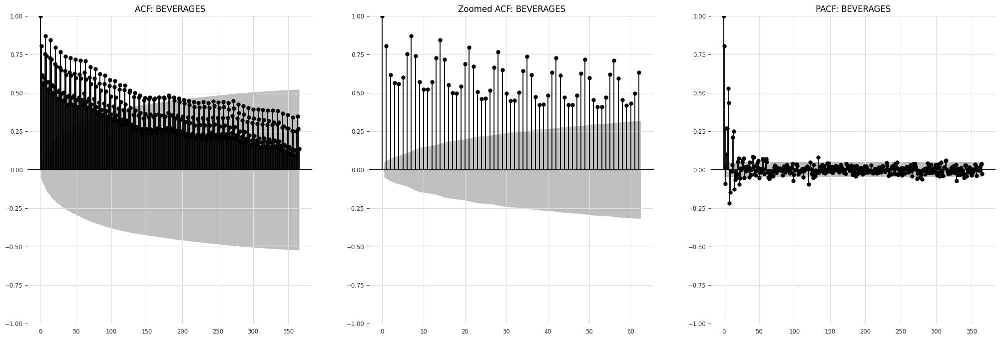

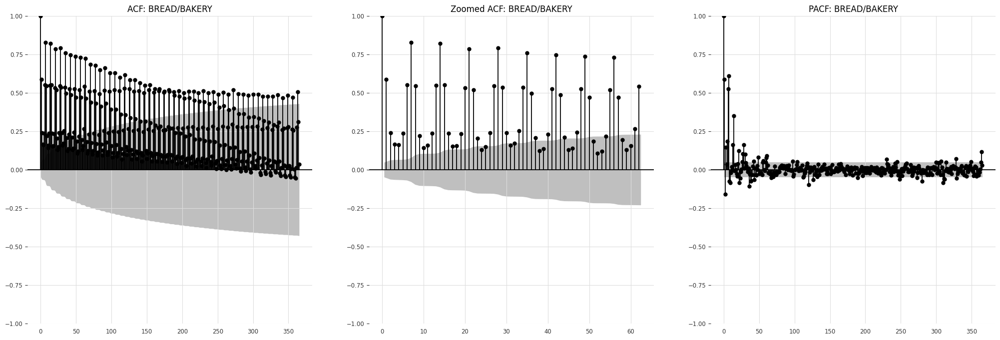

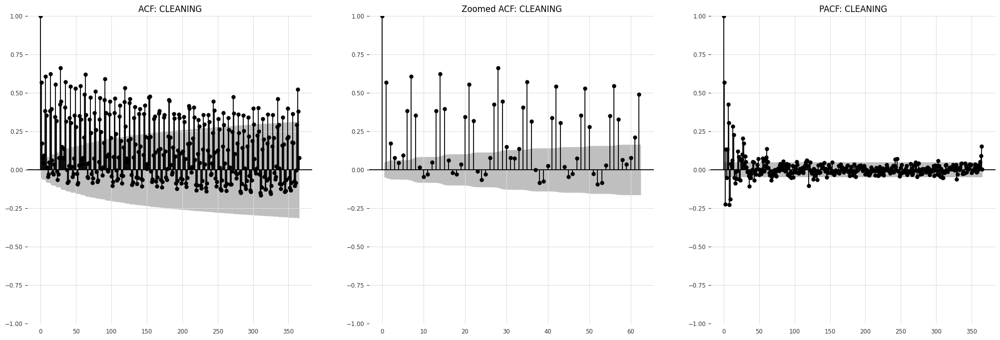

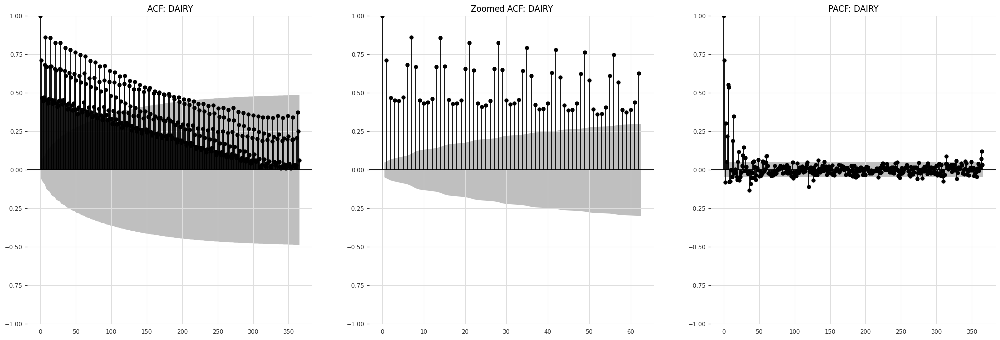

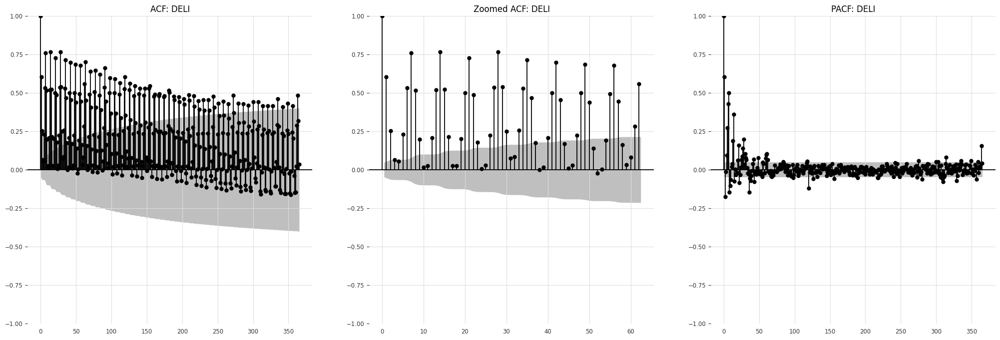

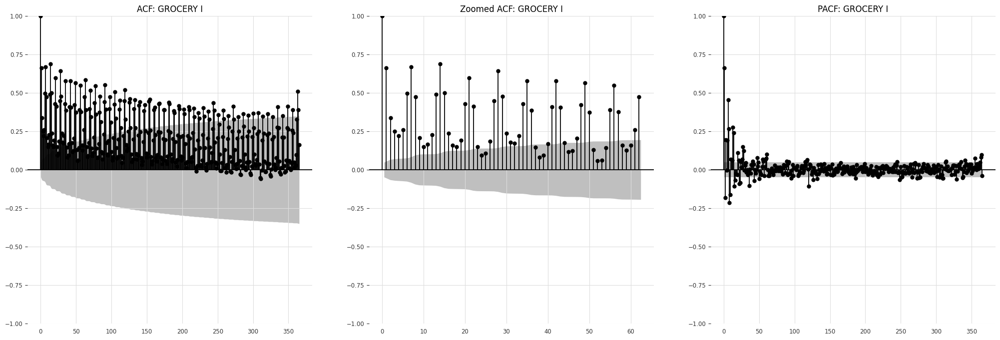

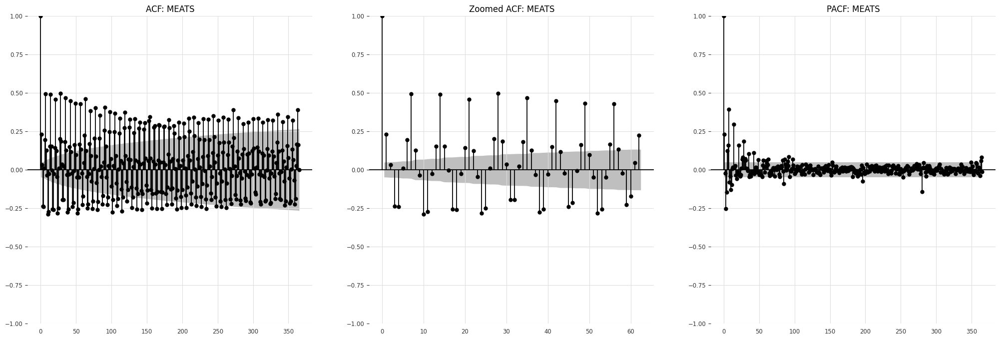

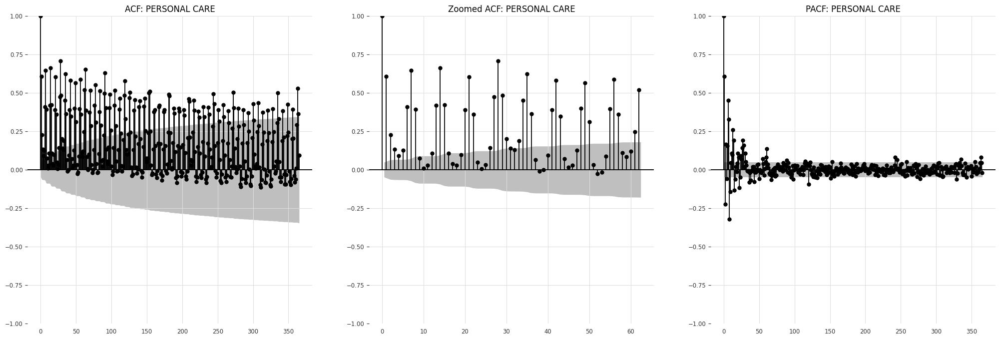

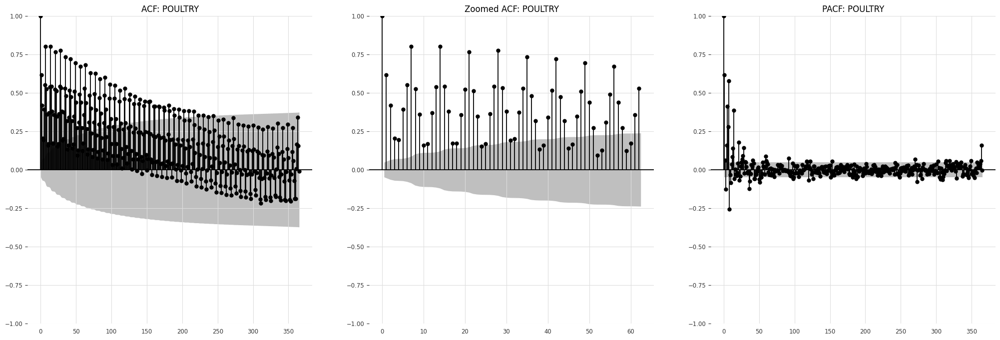

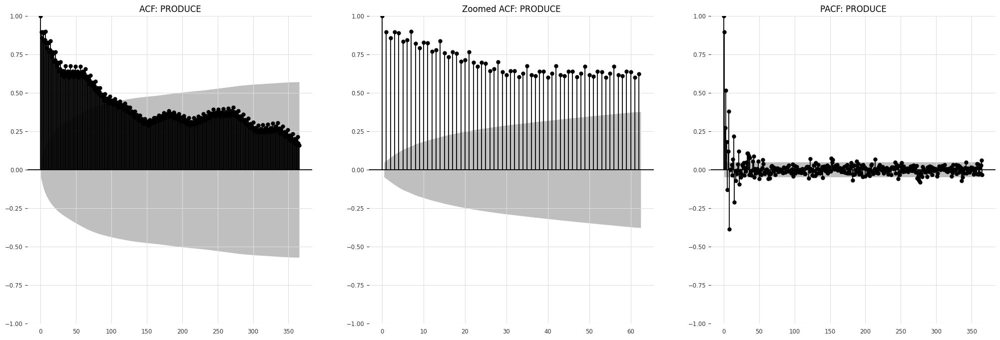

In [14]:
# PACF - ACF
temp = data[(data.sales.notnull())].groupby(['date', 'family']).sales.mean().reset_index().set_index('date')
family_unique = temp.family.unique()

for num, i in enumerate(family_unique):
    fig, ax = plt.subplots(1, 3, figsize=(25, 8))
    temp_temp = temp[(temp['family'] == i)]
    sm.graphics.tsa.plot_acf(temp_temp['sales'], lags=365, ax=ax[0], title = 'ACF: ' + i)
    sm.graphics.tsa.plot_acf(temp_temp['sales'], lags=62, ax=ax[1], title = 'Zoomed ACF: ' + i)
    sm.graphics.tsa.plot_pacf(temp_temp['sales'], lags=365, ax=ax[2], title = 'PACF: ' + i)